In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import skimage.io
import os

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
path_train = 'C:/Users/mural/Downloads/airbus-ship-detection/train_v2'
path_test = 'C:/Users/mural/Downloads/airbus-ship-detection/test_v2'

for i, j, k in os.walk(path_train):
  train_images = k
for i, j, k in os.walk(path_test):
  test_images = k

print('No of Images for train: ',len(train_images))
print('No of Images for test: ',len(test_images))

No of Images for train:  192556
No of Images for test:  15606


In [4]:
PATH = 'C:/Users/mural/Downloads/airbus-ship-detection/'
TRAIN_PATH = PATH + "train_v2/"
TEST_PATH = PATH + "test_v2/"

In [5]:
def rle_encode(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels = img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

def rle_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    if type(mask_rle) != str:
        return np.zeros(shape)
    else:
        s = mask_rle.split()
        starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
        starts -= 1
        ends = starts + lengths
        img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
        for lo, hi in zip(starts, ends):
            img[lo:hi] = 1
        return img.reshape(shape).T  # Needed to align to RLE direction


masks = pd.read_csv(PATH + "train_ship_segmentations_v2.csv")

In [6]:
masks.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


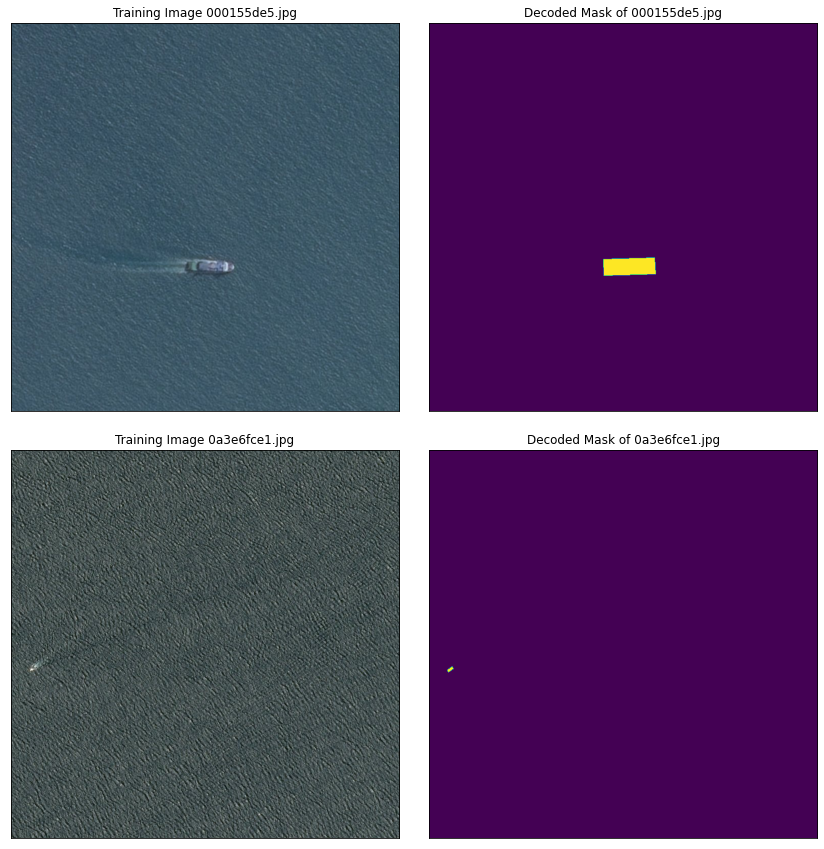

In [7]:
#%% check decode


#plt.imshow(test_img)
#plt.imshow(decode, alpha = 0.4)

#img, mask = next(in_gen)
fig = plt.figure(figsize = (15,15))
plt.subplots_adjust(wspace=0, hspace=0.1)

test_img = skimage.io.imread(PATH + 'train_v2/000155de5.jpg')
ax1 = plt.subplot(2, 2, 1)
ax1.imshow(test_img)
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
ax1.set_title('Training Image 000155de5.jpg')

test_mask = masks.loc[masks['ImageId'] == '000155de5.jpg']['EncodedPixels']
decode = rle_decode(test_mask.iloc[0])
ax2 = plt.subplot(2, 2, 2)
ax2.imshow(decode)
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)
ax2.set_title('Decoded Mask of 000155de5.jpg')


test_img = skimage.io.imread(PATH + 'train_v2/0a3e6fce1.jpg')
ax1 = plt.subplot(2, 2, 3)
ax1.imshow(test_img)
ax1.xaxis.set_visible(False)
ax1.yaxis.set_visible(False)
ax1.set_title('Training Image 0a3e6fce1.jpg')

test_mask = masks.loc[masks['ImageId'] == '0a3e6fce1.jpg']['EncodedPixels']
decode = rle_decode(test_mask.iloc[0])
ax2 = plt.subplot(2, 2, 4)
ax2.imshow(decode)
ax2.xaxis.set_visible(False)
ax2.yaxis.set_visible(False)
ax2.set_title('Decoded Mask of 0a3e6fce1.jpg')

fig.savefig('training_images_with_masks.png', bbox_inches='tight')

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400


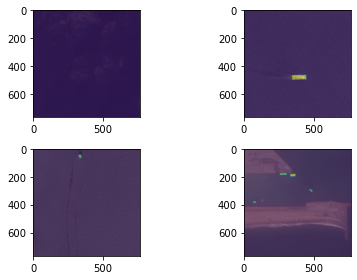

In [8]:
#%% MERGE IMAGE LAYERS WITH MULTIPLE SHIPS


masks['count'] = masks.groupby('ImageId')['EncodedPixels'].transform('count')
masks.set_index('ImageId', inplace = True)
mu = masks[masks['count'] <= 1]
mm = masks[masks['count'] > 1]
n = 0 
for mult in mm.index.unique():
    if n % 100 == 0 : print(n)
    combined = np.zeros((768, 768))
    dfm = mm.loc[mult,:]
    for i, row in dfm.iterrows():
        d = rle_decode(row['EncodedPixels'])
        combined = np.maximum(combined, d)
    new_row = row
    new_row['EncodedPixels'] = rle_encode(combined)
    mu = mu.append(new_row)
    n += 1

mu.reset_index(inplace = True)    
m0 = mu[mu['count'] == 0].iloc[0,:]
m1 = mu[mu['count'] == 1].iloc[0,:]
m2 = mu[mu['count'] == 2].iloc[0,:]
m5 = mu[mu['count'] == 5].iloc[0,:]

m0_img = skimage.io.imread(TRAIN_PATH + m0['ImageId'])
m1_img = skimage.io.imread(TRAIN_PATH + m1['ImageId'])
m2_img = skimage.io.imread(TRAIN_PATH + m2['ImageId'])
m5_img = skimage.io.imread(TRAIN_PATH + m5['ImageId'])

from skimage.util import montage

# montage_img = montage([m0_img, m1_img, m2_img, m5_img])
# plt.imshow(montage_img)

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2)
plt.tight_layout()

ax1.imshow(m0_img)
ax1.imshow(rle_decode(m0['EncodedPixels']), alpha = 0.5)

ax2.imshow(m1_img)
ax2.imshow(rle_decode(m1['EncodedPixels']), alpha = 0.5)

ax3.imshow(m2_img)
ax3.imshow(rle_decode(m2['EncodedPixels']), alpha = 0.5)

ax4.imshow(m5_img)
ax4.imshow(rle_decode(m5['EncodedPixels']), alpha = 0.5)

In [9]:
# remove corrupted files

mu['file_size_kb'] = mu['ImageId'].map(lambda c_img_id: 
                                        os.stat(os.path.join(PATH+'train_v2/', 
                                        c_img_id)).st_size/1024)
mu = mu[mu['file_size_kb']>50] # keep only 20kb files

# SAVE HERE!

In [10]:
mu.to_csv('df_train_processed.csv')
mu2 = pd.read_csv('df_train_processed.csv')

<AxesSubplot:>

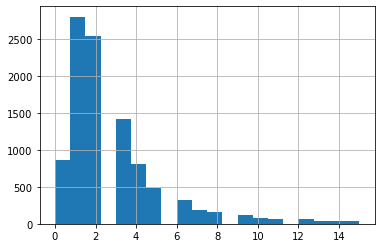

In [11]:
#%% SAMPLE    

from sklearn.model_selection import train_test_split # Train & Test Split 

df_train, df_test = train_test_split(mu2, test_size = 0.5, shuffle=True, random_state = 51)

weights = [0.001,0.02,0.1,4,5,6,7,8,9,10,11,12,13,14,15,16]

df_train['weights'] = df_train['count'].map(lambda c : weights[c])

df_train['freq'] = df_train.groupby('count')['count'].transform('count')

df_sample = df_train.sample(n = 10000, weights = df_train['weights'], random_state = 17)
df_sample_test = df_test.sample(n = 10000, random_state = 24)

df_sample['count'].hist(bins=20)

In [12]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
#import nbformat

#data_canada = px.data.gapminder().query("country == 'Canada'")


fig = make_subplots(1, 2, subplot_titles=['Training Data Ship Count','Balanced Sampling Ship Count'])

fig.add_trace(go.Histogram(x = df_train['count']), 1, 1)
fig.add_trace(go.Histogram(x = df_sample['count']), 1, 2)

fig.update_xaxes(title_text="Ship Count", row=1, col=1)
fig.update_xaxes(title_text="Ship Count", row=1, col=2)

fig.update_yaxes(title_text="Frequency", row=1, col=1)
#fig.update_yaxes(title_text="Frequency", row=1, col=2)

fig.update_layout(showlegend=False, margin=dict(l=0, r=0, t=30, b=0))

fig.write_html("ship_count_histograms.html", include_plotlyjs = 'cdn')
fig.show()

In [13]:
#%% create simple generator
def image_gen_batch(df, batch_size = 1):
    images = np.array(df['ImageId'])
    masks = np.array(df['EncodedPixels'])
    ind = np.arange(len(images))
    np.random.shuffle(ind)
    images = images[ind]
    masks = masks[ind]
    i = 0
    while True:
        batch_img = []
        batch_mask = []
        for x in np.arange(batch_size):
            if i == len(images):
                # loop to beginning and re-shuffle
                i = 0
                np.random.shuffle(ind)
                images = images[ind]
                masks = masks[ind]
            batch_img.append(skimage.io.imread(TRAIN_PATH + images[i])/255.0)
            batch_mask.append(np.reshape(rle_decode(masks[i]),(768,768,1)))
            i += 1
        #img = skimage.io.imread(TRAIN_PATH + images[i])
        #mask = np.reshape(rle_decode(masks[i]),(768,768,1))
        yield (np.array(batch_img), np.array(batch_mask))
        #i += 1

(4, 768, 768, 3) (4, 768, 768, 1)


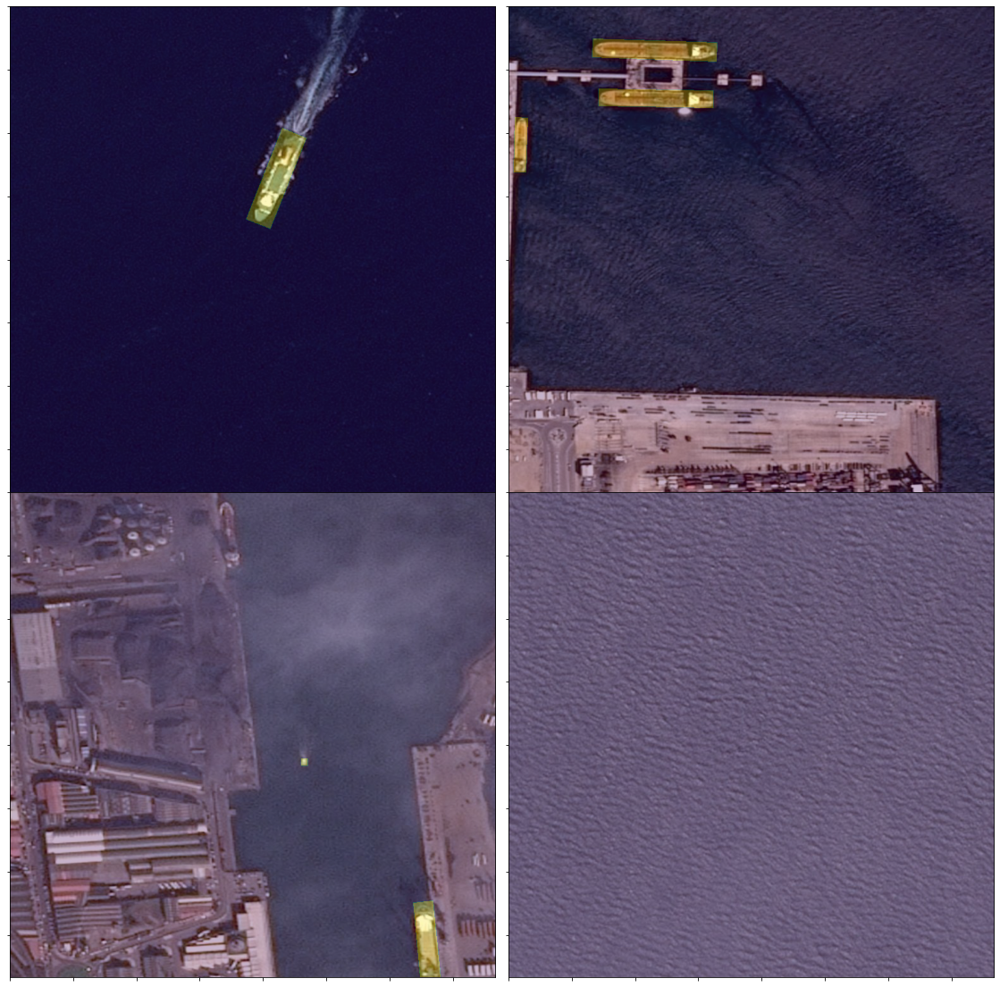

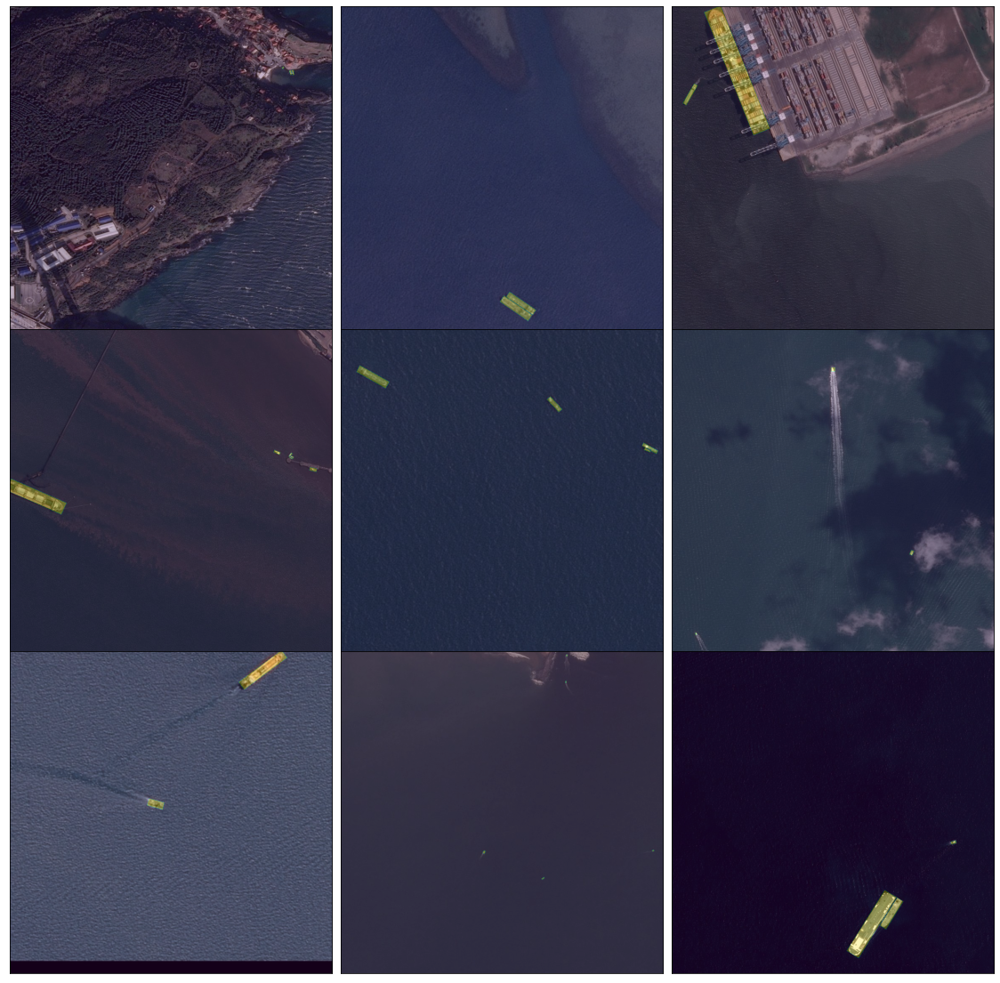

In [14]:
train_gen = image_gen_batch(df_sample, batch_size = 4)
X_train, y_train = next(train_gen)
print(np.shape(X_train), np.shape(y_train))


def plot_img_batch(img, mask):
    fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize = (20,20))
    plt.subplots_adjust(wspace=0, hspace=0)
    ax1.imshow(img[0])
    ax1.imshow(np.reshape(mask[0],(768,768)), alpha = 0.3)
    ax1.set_yticklabels([])
    ax1.set_xticklabels([])

    ax2.imshow(img[1])
    ax2.imshow(np.reshape(mask[1],(768,768)), alpha = 0.3)
    ax2.set_yticklabels([])
    ax2.set_xticklabels([])

    ax3.imshow(img[2])
    ax3.imshow(np.reshape(mask[2],(768,768)), alpha = 0.3)
    ax3.set_yticklabels([])
    ax3.set_xticklabels([])

    ax4.imshow(img[3])
    ax4.imshow(np.reshape(mask[3],(768,768)), alpha = 0.3)
    ax4.set_yticklabels([])
    ax4.set_xticklabels([])
    
def plot_img_batch2(in_gen, nrows = 1, ncols = 1):
    img, mask = next(in_gen)
    fig = plt.figure(figsize = (20,20))
    plt.subplots_adjust(wspace=0, hspace=0)
    for i in np.arange(nrows*ncols):
        ax = plt.subplot(nrows, ncols, i+1)
        ax.imshow(img[i])
        ax.imshow(np.reshape(mask[i],(768,768)), alpha = 0.3)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
    return fig

plot_img_batch(X_train,y_train)


test_gen = image_gen_batch(df_test[df_test['count']>3], batch_size = 4)
X_test, y_test = next(test_gen)

fig = plot_img_batch2(image_gen_batch(df_sample[df_sample['count'] >= 2], batch_size = 9), nrows = 3, ncols = 3)
fig.savefig('images_with_multiple_ships.png',  bbox_inches='tight')

In [15]:
from keras.callbacks import ModelCheckpoint
from keras.callbacks import CSVLogger
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam

import skimage.io as io
import skimage.transform as trans
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras
import keras.backend as K
from keras.losses import binary_crossentropy
from keras import Input

In [16]:
# define loss function and metrics
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)
def dice_p_bce(in_gt, in_pred):
    return 1e-3*binary_crossentropy(in_gt, in_pred) - dice_coef(in_gt, in_pred)
def true_positive_rate(y_true, y_pred):
    return K.sum(K.flatten(y_true)*K.flatten(K.round(y_pred)))/K.sum(y_true)
def unet(pretrained_weights = None,input_size = (256,256,1)):

    inputs = Input(input_size)
    
    pp_in_layer = inputs
    
    pp_in_layer = GaussianNoise(0.1)(pp_in_layer)
    pp_in_layer = BatchNormalization()(pp_in_layer)
    conv1 = Conv2D(8, 3, activation = 'relu', padding = 'same')(pp_in_layer)
    conv1 = Conv2D(8, 3, activation = 'relu', padding = 'same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    
    conv2 = Conv2D(16, 3, activation = 'relu', padding = 'same')(pool1)
    conv2 = Conv2D(16, 3, activation = 'relu', padding = 'same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    
    conv3 = Conv2D(32, 3, activation = 'relu', padding = 'same')(pool2)
    conv3 = Conv2D(32, 3, activation = 'relu', padding = 'same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    
    conv4 = Conv2D(64, 3, activation = 'relu', padding = 'same')(pool3)
    conv4 = Conv2D(64, 3, activation = 'relu', padding = 'same')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)
    conv5 = Conv2D(128, 3, activation = 'relu', padding = 'same')(pool4)
    conv5 = Conv2D(128, 3, activation = 'relu', padding = 'same')(conv5)
    drop5 = Dropout(0.5)(conv5)
    up6 = Conv2D(64, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(drop5))
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(64, 3, activation = 'relu', padding = 'same')(merge6)
    conv6 = Conv2D(64, 3, activation = 'relu', padding = 'same')(conv6)
    up7 = Conv2D(32, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(32, 3, activation = 'relu', padding = 'same')(merge7)
    conv7 = Conv2D(32, 3, activation = 'relu', padding = 'same')(conv7)
    up8 = Conv2D(16, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(16, 3, activation = 'relu', padding = 'same')(merge8)
    conv8 = Conv2D(16, 3, activation = 'relu', padding = 'same')(conv8)
    up9 = Conv2D(8, 2, activation = 'relu', padding = 'same')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(8, 3, activation = 'relu', padding = 'same')(merge9)
    conv9 = Conv2D(8, 3, activation = 'relu', padding = 'same')(conv9)
    conv9 = Conv2D(2, 3, activation = 'relu', padding = 'same')(conv9)
    conv10 = Conv2D(1, 1, activation = 'sigmoid')(conv9)
    model = Model(inputs = inputs, outputs = conv10)
    
    model.compile(optimizer=Adam(1e-4, decay=1e-6), loss=dice_p_bce, metrics=[dice_coef, 'binary_accuracy', true_positive_rate])
    if(pretrained_weights):
      model.load_weights(pretrained_weights)
    return model

In [17]:
int(len(df_train)/32)

2988

In [18]:
m= unet(input_size = np.shape(X_train)[1:])

BATCH_SIZE = 32

checkpoint = ModelCheckpoint(PATH + "checkpoints.out", monitor='accuracy', 
                             verbose=1, save_best_only=True, mode='max')

csv_logger = CSVLogger(PATH + "log.out", append=True, separator=';')

earlystopping = EarlyStopping(monitor = 'accuracy', verbose = 1,
                              min_delta = 0.01, patience = 3, mode = 'max')

callbacks_list = [checkpoint, csv_logger, earlystopping]


results = m.fit_generator(image_gen_batch(df_train),
                          epochs = 5, 
                          steps_per_epoch = int(len(df_train)/32),
                          validation_data = image_gen_batch(df_test), 
                          validation_steps = int(len(df_test)/32),
                          callbacks = callbacks_list)
m.save('Model.h5')

Epoch 1/5
2988/2988 [==============================] - 9251s 3s/step - loss: -0.4695 - dice_coef: 0.4704 - binary_accuracy: 0.9981 - true_positive_rate: nan - val_loss: -0.5478 - val_dice_coef: 0.5480 - val_binary_accuracy: 0.9989 - val_true_positive_rate: nan
Epoch 2/5
2988/2988 [==============================] - 39300s 13s/step - loss: -0.5505 - dice_coef: 0.5507 - binary_accuracy: 0.9988 - true_positive_rate: nan - val_loss: -0.5589 - val_dice_coef: 0.5590 - val_binary_accuracy: 0.9987 - val_true_positive_rate: nan
Epoch 3/5
2988/2988 [==============================] - 18373s 6s/step - loss: -0.5866 - dice_coef: 0.5867 - binary_accuracy: 0.9989 - true_positive_rate: nan - val_loss: -0.6080 - val_dice_coef: 0.6081 - val_binary_accuracy: 0.9989 - val_true_positive_rate: nan
Epoch 4/5
2988/2988 [==============================] - 9747s 3s/step - loss: -0.6095 - dice_coef: 0.6096 - binary_accuracy: 0.9988 - true_positive_rate: nan - val_loss: -0.5719 - val_dice_coef: 0.5719 - val_binary_